In [ ]:
import sys, os
sys.path.insert(0, r"C:\Users\Utente\Desktop\progetto vscode\src")

In [1]:

import numpy as np
import networkx as nx
import ot
import matplotlib.pyplot as plt
import seaborn as sns
import random
# from EDRep import NodeEmbedding  
from functions import *
import pandas as pd
import glob
from nilearn import datasets
import itertools
from nilearn.connectome import ConnectivityMeasure

# from EDRep_main.EDRep import NodeEmbedding

ModuleNotFoundError: No module named 'nilearn'

Download of the files

In [2]:

abide = datasets.fetch_abide_pcp(
    data_dir=r'C:\Users\Utente\Desktop\progetto vscode\data\abide_data',   
    n_subjects=1112,            # number subjects
    pipeline='cpac',           
    derivatives=['rois_ho']    # atlante Harvard-Oxford 
)

#LABEL 
phenotypes = abide.phenotypic 


# time series
for timeseries in abide.rois_ho:
    print(timeseries.shape)

[fetch_abide_pcp] Dataset found in C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(78, 111)
(78, 111)
(78, 111)
(78, 111)
(

In [3]:
def create_ABIDE_graph(file_name):
    df = pd.read_csv(file_name, sep='\t')

    # columns became numbers not strings
    df.columns = [int(s[1:]) for s in df.columns]

    W = df.corr().values
    n, _ = W.shape
    W = W - np.eye(n)

    return np.exp(W)-np.eye(n)

    # G = nx.Graph()

    # for col in corr_matrix.columns:
    #     G.add_node(col, label=col)
        
    # threshold = 0.
    # for i in range(len(corr_matrix.columns)):
    #     for j in range(i + 1, len(corr_matrix.columns)):
    #         weight = corr_matrix.iloc[i, j]
    #         if weight > threshold: # type: ignore
        
    #             node_a = corr_matrix.columns[i]
    #             node_b = corr_matrix.columns[j]
    #             G.add_edge(node_a, node_b, weight=np.exp(weight))
    # return G
        

In [12]:
def delete_nan(g):
    for line in g:
        for i in range(len(line)):
            if line[i]!= line[i]:
                line[i]=0
    return g

In [9]:
def node_embedding(g_a, partition_A, dim_embedding,seed=42):
    # save the seed state
    rdn_state = np.random.get_state()
    random.seed(seed)
    np.random.seed(seed)
    embedding_a = NodeEmbedding(g_a, dim=dim_embedding, k=1, verbose=False)
    X_total = embedding_a.X
    X_list = [X_total[list(nodes), :] for nodes in partition_A]
    np.random.set_state(rdn_state)
    return X_list



In [6]:
files_folder = r"C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp\cpac\nofilt_noglobal"
names_files = os.listdir(files_folder)

def file_found(file_id_dataframe):
    file_id_str = str(file_id_dataframe)
    # see if this name is in the ffolder of the files
    return any(file_id_str in name for name in names_files)

In [7]:
def f_norm_opt(embx,emby):
    x=np.array([e[0] for e in embx])
    y=np.array([e[0] for e in emby])
    norm00=np.linalg.norm(x.T@x)
    norm11=np.linalg.norm(y.T@y)
    norm01=np.linalg.norm(x.T@y)
    finale_norm=np.sqrt(norm00**2+norm11**2-2*norm01**2)/np.sqrt(2)
    return finale_norm

In [10]:
partition=[[i] for i in range(111)]

In [9]:
folder = r"C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp\cpac\nofilt_noglobal"
path_files = glob.glob(os.path.join(folder, "*.1D"))
all_graphs=[]
for file in path_files:
    g=create_ABIDE_graph(file)
    all_graphs.append(g)
print(all_graphs)

[array([[0.        , 1.78291474, 1.80646589, ..., 1.14202699, 1.93062957,
        1.94565973],
       [1.78291474, 0.        , 1.35663128, ..., 1.05450149, 1.34719225,
        1.32871118],
       [1.80646589, 1.35663128, 0.        , ..., 1.3482051 , 1.59458353,
        1.59932147],
       ...,
       [1.14202699, 1.05450149, 1.3482051 , ..., 0.        , 1.09063825,
        1.11855139],
       [1.93062957, 1.34719225, 1.59458353, ..., 1.09063825, 0.        ,
        2.46493557],
       [1.94565973, 1.32871118, 1.59932147, ..., 1.11855139, 2.46493557,
        0.        ]], shape=(111, 111)), array([[0.        , 1.5562147 , 1.84176532, ..., 0.90379632, 1.37040858,
        1.3761181 ],
       [1.5562147 , 0.        , 1.3081569 , ..., 0.82784399, 1.28844164,
        1.19895271],
       [1.84176532, 1.3081569 , 0.        , ..., 0.97568137, 1.1159345 ,
        1.36033337],
       ...,
       [0.90379632, 0.82784399, 0.97568137, ..., 0.        , 1.11941813,
        1.09198128],
       [1.37040

In [10]:
all_graphs_wo_nan=[]
for g in all_graphs:
    all_graphs_wo_nan.append(delete_nan(g))

Given that the partition are all the same I calculate only the one for the first graph

In [17]:
file_path_1 =r'C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp\cpac\nofilt_noglobal\Caltech_0051461_rois_ho.1D'
df_1 = pd.read_csv(file_path_1, sep='\s+')

file_path_2 =r'C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp\cpac\nofilt_noglobal\Caltech_0051463_rois_ho.1D'
df_2 = pd.read_csv(file_path_2, sep='\s+')
# Calcola la matrice di correlazione (Matrice NxN)
# pandas.corr() calcola di default la correlazione di Pearson tra tutte le colonne
corr_matrix_1 = df_1.corr().to_numpy().copy()
corr_matrix_2 = df_2.corr().to_numpy().copy()

print(f"Dimensione originale: {df_1.shape} (Tempo x Nodi)")
print(f"Dimensione grafo: {corr_matrix_1.shape} (Nodi x Nodi)")


print(f"Dimensione originale: {df_2.shape} (Tempo x Nodi)")
print(f"Dimensione grafo: {corr_matrix_2.shape} (Nodi x Nodi)")

# Rimuoviamo gli auto-loop (la correlazione di un nodo con se stesso è 1)
np.fill_diagonal(corr_matrix_1, 0)
np.fill_diagonal(corr_matrix_2, 0)

soglia = 0.5
adj_matrix_1 = np.where(np.abs(corr_matrix_1) > soglia, corr_matrix_1, 0)
adj_matrix_2 = np.where(np.abs(corr_matrix_2) > soglia, corr_matrix_2, 0)

print(adj_matrix_1)
print(adj_matrix_2)


Dimensione originale: (146, 111) (Tempo x Nodi)
Dimensione grafo: (111, 111) (Nodi x Nodi)
Dimensione originale: (146, 111) (Tempo x Nodi)
Dimensione grafo: (111, 111) (Nodi x Nodi)
[[0.         0.57824952 0.59137239 ... 0.         0.65784615 0.66560111]
 [0.57824952 0.         0.         ... 0.         0.         0.        ]
 [0.59137239 0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.65784615 0.         0.         ... 0.         0.         0.90216567]
 [0.66560111 0.         0.         ... 0.         0.90216567 0.        ]]
[[0.         0.         0.61072452 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.61072452 0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.63560171]
 [0.

<>:2: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
<>:5: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
<>:2: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
<>:5: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
C:\Users\Utente\AppData\Local\Temp\ipykernel_2876\3102991809.py:2: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
  df_1 = pd.read_csv(file_path_1, sep='\s+')
C:\Users\Utente\AppData\Local\Temp\ipykernel_2876\3102991809.py:5: SyntaxWarning: "\s" is an invalid escape sequence. Such sequen

In [18]:
g1=delete_nan(adj_matrix_1)
g2=delete_nan(adj_matrix_2)


In [19]:
emb1=node_embedding(g1,partition,16)
emb2=node_embedding(g2,partition,16)

In [20]:
d12, vec12, data12 = w2_distance_classes(emb1,emb2)
print(d12)

41.196196756121296


In [11]:
g0= all_graphs[0]
g1= all_graphs[1]

In [12]:
emb_0=node_embedding(g0,partition,16)
emb_1=node_embedding(g1,partition,16)

In [13]:
d01, vec01, data01 = w2_distance_classes(emb_0,emb_1)
print(d01)

15.35250870625459


In [14]:
x=np.array([e[0] for e in emb_0])
y=np.array([e[0] for e in emb_1])
np.linalg.norm(x@x.T-y@y.T)/np.sqrt(2)

np.float64(15.35250870625459)

In [15]:
f_norm_opt(emb_0,emb_1)

np.float64(15.352508706254596)

In [16]:
df_phenotipic = pd.read_csv(r"C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp\Phenotypic_V1_0b_preprocessed1.csv")

df_def = df_phenotipic[df_phenotipic['FILE_ID'].apply(file_found)]


In [17]:
dx_val = df_def['DX_GROUP'].tolist()
emb_list_control=[]
emb_list_autistic=[]

for g, dx in zip(all_graphs_wo_nan, dx_val):
    if dx == 1:
        # emb_1=node_embedding(g,partition,16)
        emb_1 = np.array(node_embedding(g,partition,32))[:,0,:]
        emb_list_control.append(emb_1)
    elif dx == 2:
        emb_2 = np.array(node_embedding(g,partition,32))[:,0,:]
        emb_list_autistic.append(emb_2)


print(len(emb_list_control))
print(len(emb_list_autistic))

403
468


In [18]:
X = np.concatenate([emb_list_control, emb_list_autistic])

n, _, _ = X.shape
D = np.zeros((n,n))

for i in range(n):
    for j in range(n):
        D[i,j] = f_norm_opt(X[i], X[j])

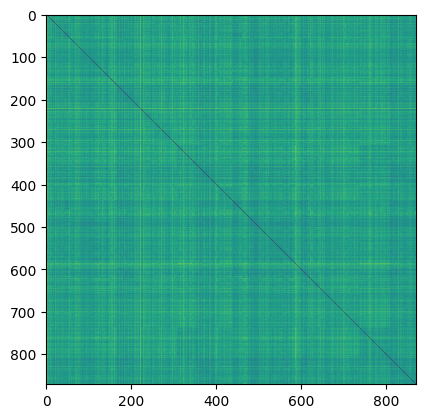

In [19]:
plt.imshow(D)

NYU

df_phenotipic = pd.read_csv(r"C:\Users\Utente\Desktop\progetto vscode\ABIDE\abide_data\ABIDE_pcp\Phenotypic_V1_0b_preprocessed1.csv")
df_NYU = df_phenotipic[df_phenotipic['SITE_ID'] == 'NYU']

# filter function
df_NYU_def = df_NYU[df_NYU['FILE_ID'].apply(file_found)]

print(f"NYU subjects for which I have files: {len(df_NYU_def)}")
print(df_NYU_def.head())

folder_nyu = r"C:\Users\Utente\Desktop\progetto vscode\ABIDE\abide_data\ABIDE_pcp\cpac\nyu"
path_files_nyu = glob.glob(os.path.join(folder_nyu, "*.1D"))
all_graphs_nyu=[]
for file in path_files_nyu:
    g_nyu=create_ABIDE_graph(file)
    all_graphs_nyu.append(g_nyu)
print(all_graphs_nyu)

all_graphs_nyu_wo_nan=[]
for g in all_graphs_nyu:
    all_graphs_nyu_wo_nan.append(delete_nan(g))
    
valori_dx = df_NYU_def['DX_GROUP'].tolist()
emb_list_control=[]
emb_list_autistic=[]

for g, dx in zip(all_graphs_nyu, valori_dx):
    if dx == 1:
        # emb_1=node_embedding(g,partition,16)
        emb_1 = np.array(node_embedding(abs(g),partition,32))[:,0,:]
        emb_list_control.append(emb_1)
    elif dx == 2:
        emb_2 = np.array(node_embedding(abs(g),partition,32))[:,0,:]
        emb_list_autistic.append(emb_2)


print(len(emb_list_control))
print(len(emb_list_autistic))

In [20]:
w2_list_control=[]
for a, b in itertools.combinations(emb_list_control, 2):
    d=f_norm_opt(a,b)
    w2_list_control.append(d)
print(w2_list_control)

[np.float64(1.894839633077655), np.float64(2.3517372749578396), np.float64(2.1513996577344288), np.float64(1.8453085629769514), np.float64(1.7418764105731268), np.float64(1.7105053733525637), np.float64(1.8841592812647785), np.float64(1.944254991047501), np.float64(1.849124172317373), np.float64(1.8890359877539777), np.float64(1.9420176658194588), np.float64(1.383221104805948), np.float64(2.0143598419419244), np.float64(1.7578898338111666), np.float64(1.4297378852289757), np.float64(1.6424325963613688), np.float64(2.092826212144585), np.float64(1.4233968490122166), np.float64(1.4590430684848463), np.float64(1.6630739754851298), np.float64(1.61964456927448), np.float64(2.148276940567974), np.float64(1.8893798607517167), np.float64(1.8527740936066792), np.float64(1.4891398193463743), np.float64(1.5397207617115791), np.float64(2.1190239138710427), np.float64(1.738744539670469), np.float64(1.496094999369139), np.float64(1.7270371477417517), np.float64(1.8029609484249114), np.float64(1.9780

In [21]:
print(max(w2_list_control))
print(min(w2_list_control))
print(np.mean(w2_list_control))

3.228511744793129
0.9707567784047754
1.8504547394879376


<function matplotlib.pyplot.show(close=None, block=None)>

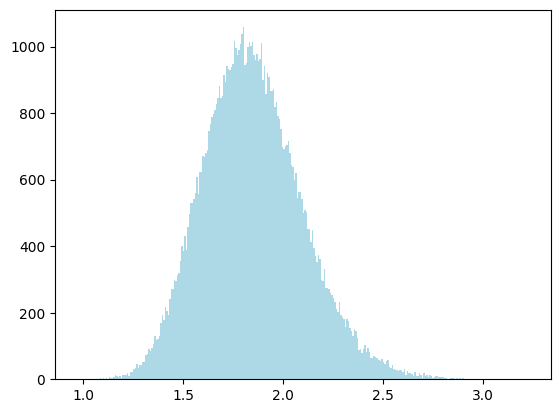

In [22]:
plt.hist(w2_list_control, bins=300, color='lightblue')
plt.show

In [23]:
w2_list_autistic=[]
for a, b in itertools.combinations(emb_list_autistic, 2):
    d=f_norm_opt(a,b)
    w2_list_autistic.append(d)
print(w2_list_autistic)

[np.float64(1.6830207634592946), np.float64(2.0595302979622376), np.float64(1.9083918177900245), np.float64(2.1859699591374526), np.float64(2.0611088495203282), np.float64(2.312147667559098), np.float64(2.2681023850342994), np.float64(2.2491652332681773), np.float64(2.0869957053618617), np.float64(2.0941002084494027), np.float64(2.2457079599112224), np.float64(2.3855542122175346), np.float64(1.8278874341218503), np.float64(2.2538919570110356), np.float64(1.9888928611565404), np.float64(1.8306356623835258), np.float64(2.422980583627289), np.float64(1.846148351096719), np.float64(2.173339043483677), np.float64(2.656895289705666), np.float64(2.122200040917429), np.float64(2.0020912860339424), np.float64(2.2344644933856577), np.float64(2.4937692333598562), np.float64(2.5153707813367228), np.float64(2.0852430279916505), np.float64(1.944605268806177), np.float64(2.2893539370540927), np.float64(2.027002920527381), np.float64(2.2232595657477816), np.float64(2.5738698136259566), np.float64(2.56

In [24]:

print(max(w2_list_autistic))
print(min(w2_list_autistic))
print(np.mean(w2_list_autistic))

2.9229002862646207
0.6882665308536536
1.8170423344868734


<function matplotlib.pyplot.show(close=None, block=None)>

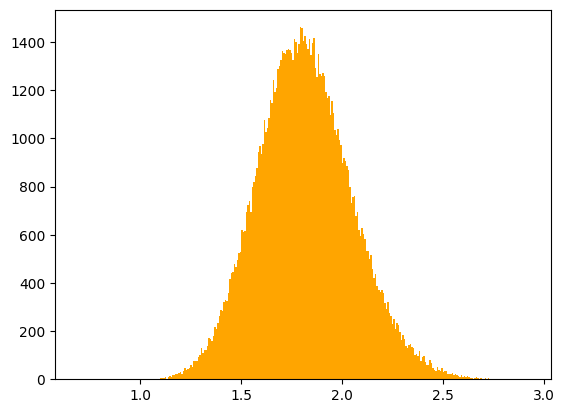

In [25]:
plt.hist(w2_list_autistic, bins=300, color='orange')
plt.show

In [26]:
w2_mix=[]
for control in emb_list_control:
    for autistic in emb_list_autistic:
        d=f_norm_opt(control,autistic)
        w2_mix.append(d)
print(w2_mix)

[np.float64(2.0311136259189766), np.float64(1.5527228674856561), np.float64(1.830141554402167), np.float64(1.5933272037254524), np.float64(1.8065555430734066), np.float64(1.6505956586278), np.float64(1.826998156027576), np.float64(1.8975413434518333), np.float64(1.7865814570304472), np.float64(1.7362593034286404), np.float64(1.5979804530713622), np.float64(1.5232111468267386), np.float64(1.727594137830176), np.float64(1.6391189504529728), np.float64(1.8681490156887393), np.float64(1.5242157205516556), np.float64(2.122932109119292), np.float64(2.0280794791488614), np.float64(1.5625372977834462), np.float64(1.5677692065158422), np.float64(2.1347828922431864), np.float64(1.6398298851821698), np.float64(1.233370252767635), np.float64(1.7660477970265103), np.float64(1.80424437883115), np.float64(1.9214319910730464), np.float64(1.803452426245008), np.float64(1.2659490651490857), np.float64(1.7123429719823282), np.float64(1.9243571978960639), np.float64(1.7728143085319032), np.float64(1.82200

In [27]:
print(max(w2_mix))
print(min(w2_mix))
print(np.mean(w2_mix))

3.0296311186602654
1.0294420544316192
1.8355478479096021


<function matplotlib.pyplot.show(close=None, block=None)>

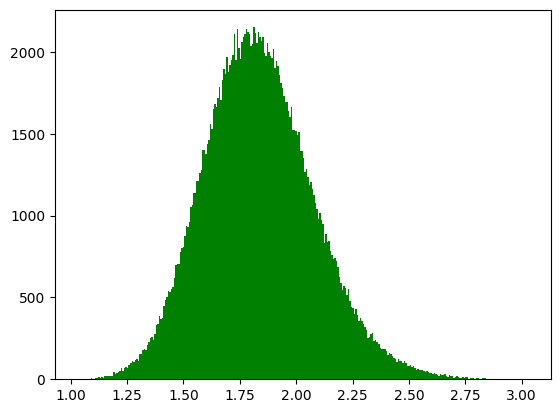

In [28]:
plt.hist(w2_mix, bins=300, color='green')
plt.show

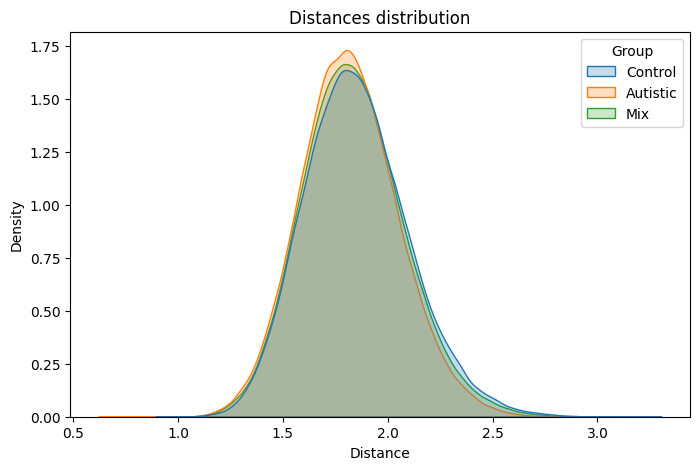

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

df_plot = pd.DataFrame({
    'Distance': w2_list_control + w2_list_autistic + w2_mix,
    'Group': ['Control'] * len(w2_list_control) + ['Autistic'] * len(w2_list_autistic) + ['Mix'] * len(w2_mix)
})

plt.figure(figsize=(8, 5))
sns.kdeplot(data=df_plot, x='Distance', hue='Group', fill=True, common_norm=False)
plt.title("Distances distribution")
plt.show()
